**DISCLAIMER**

The written and verbal content of this exhibition are the exhibitor's own and under no circumstances does it reflect the position of his or her employers. Likewise, the opinions expressed in this training are those of the speaker and do not reflect the presentation of his or her employers.

**DESCARGO DE RESPONSABILIDAD**

El contenido escrito y verbal de esta exposición son propios del expositor y bajo ninguna circunstancia refleja la posición de sus empleadores. De igual manera las opiniones vertidas en este entrenamiento son propias del expositor y no reflejan la exposición de sus empleadores.

# **Quito AI workshop**

**Done by:**
Sebastian Sarasti

Data Scientist and Machine Learning Engineer
LinkedIn: https://www.linkedin.com/in/sebastiansarasti/

## **Tools**

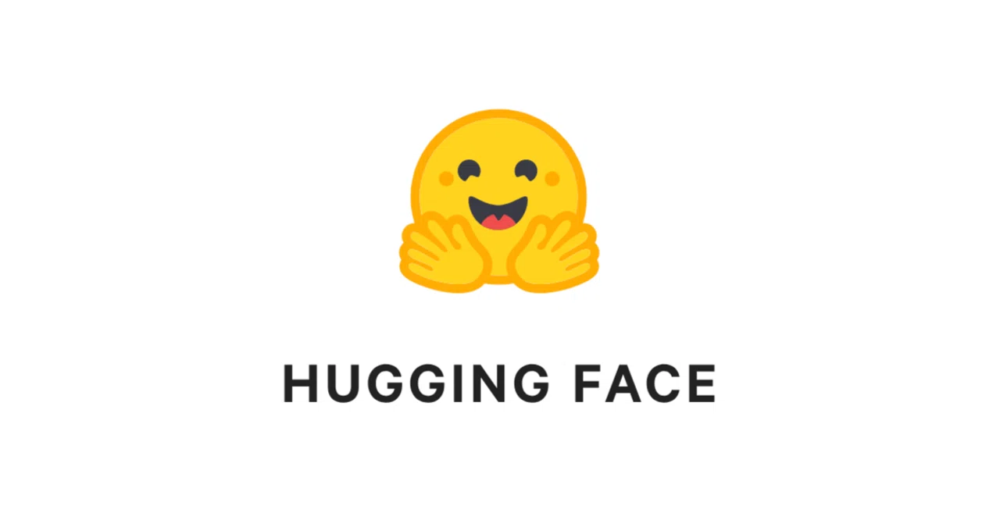

https://huggingface.co/

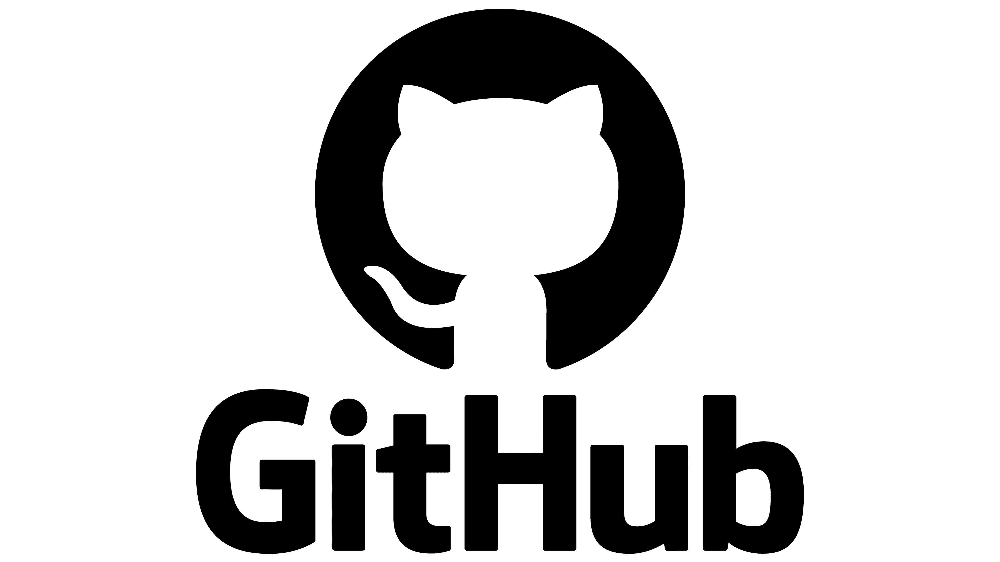

https://github.com/

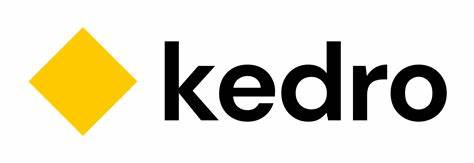

https://kedro.org/

## **Model repositories**:

- Convolutional Neural Network: https://huggingface.co/sebastiansarasti/CnnLeukemiaClassification
- Vision Transformer: https://huggingface.co/sebastiansarasti/ViTLeukemiaClassification
- GitHub: https://github.com/sebassaras02/quito-ai-day

# **Supervised learning**

## **Types of supervised learning**

### **Regression**

In this approach, you train a model to predict a variable which can produce a numerical output.

**Applications**:

Weather forecasting

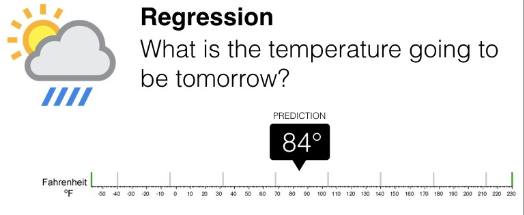

Stocks forecasting

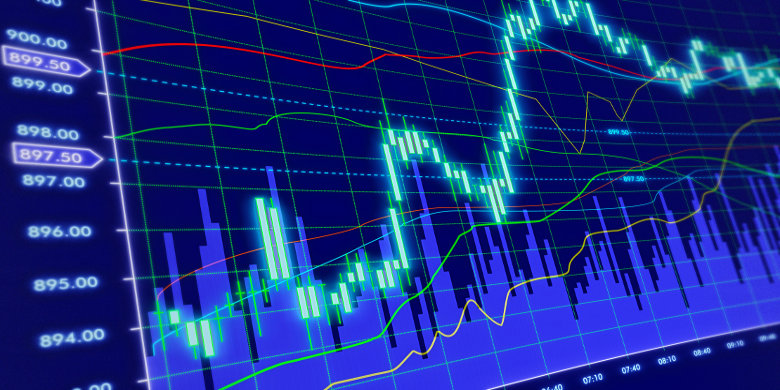

Inventory optimization

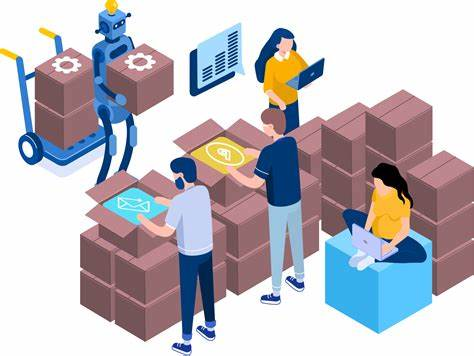

### **Classification**

In this approach, you train a model to predict categorical variables. In this case, the output is a category and can not take intermediate values.

**Applications**:

Churn modeling

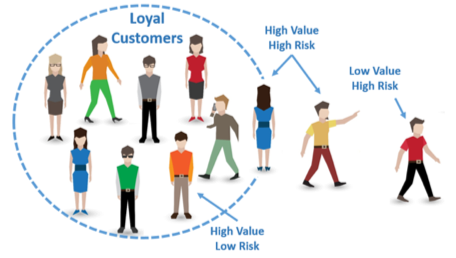

Sentiment analysis

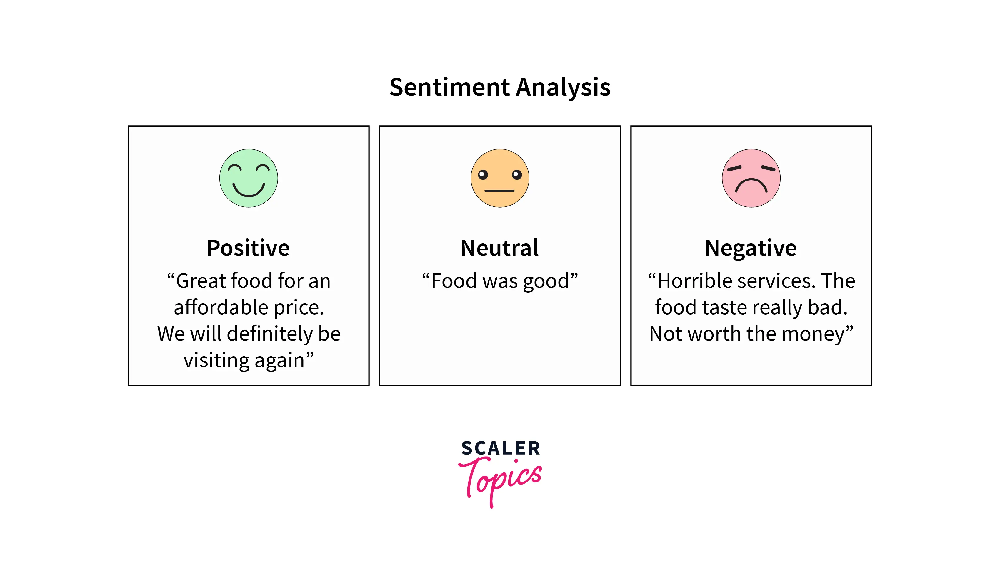

# **Exercise**

**Leukemia classification based on images.**

- Cancer type very commmon in children
- Classification problem
- Waiting time


**Dataset**: https://www.kaggle.com/datasets/mehradaria/leukemia.

**Reference**

Mehrad Aria, Mustafa Ghaderzadeh, Davood Bashash, Hassan Abolghasemi, Farkhondeh Asadi, and Azamossadat Hosseini, “Acute Lymphoblastic Leukemia (ALL) image dataset.” Kaggle, (2021). DOI: 10.34740/KAGGLE/DSV/2175623.


### **Data Exploration**


**1. Download data from Kaggle**

In [1]:
# @title
%%capture
!pip install kaggle
from google.colab import drive
drive.mount('/content/drive')
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/Kaggle/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d mehradaria/leukemia
!unzip /content/leukemia.zip

**2. Explore the data**

Let's see what we have in the dataset

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

Create a function to show a picture

In [3]:
def show_picture(path):
  img = plt.imread(path)
  plt.imshow(img)

See a benign case

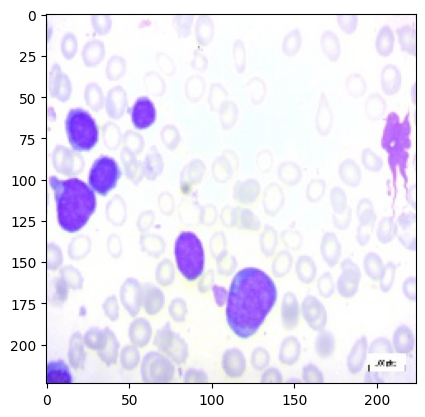

In [4]:
show_picture("/content/Original/Benign/WBC-Benign-001.jpg")

See an early stage case

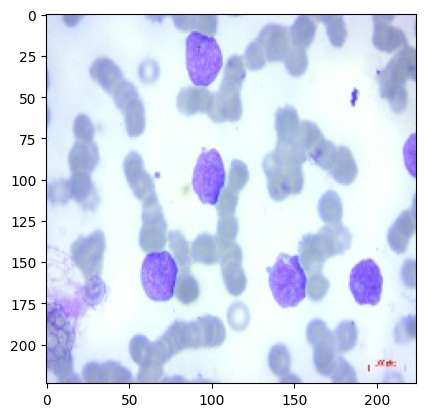

In [5]:
show_picture("/content/Original/Early/WBC-Malignant-Early-001.jpg")

Pre stage case

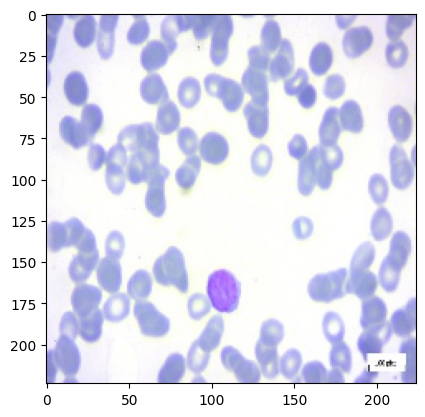

In [6]:
show_picture("/content/Original/Pre/WBC-Malignant-Pre-001.jpg")

Pro stage case

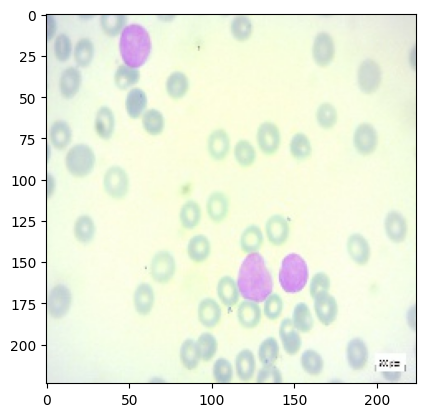

In [7]:
show_picture("/content/Original/Pro/WBC-Malignant-Pro-001.jpg")

## **Modeling**

### **Convolutional Neural Networks**

**Interaction?**

How can you distinguish the dog and the cat?

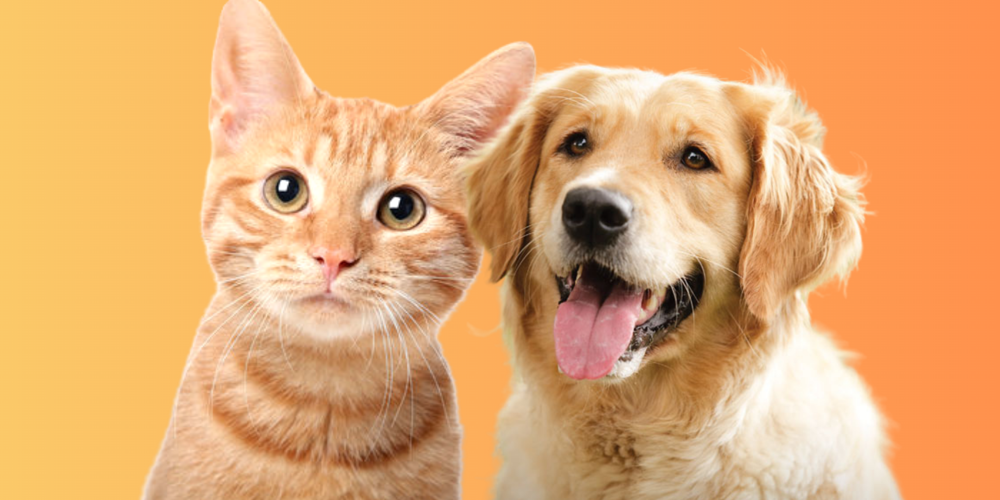

**Neural networks**

**Interaction:**

What is a perceptron?

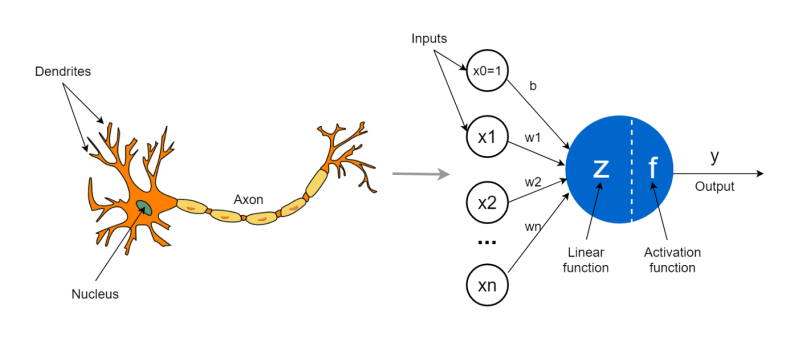

What if we use many neurons ...

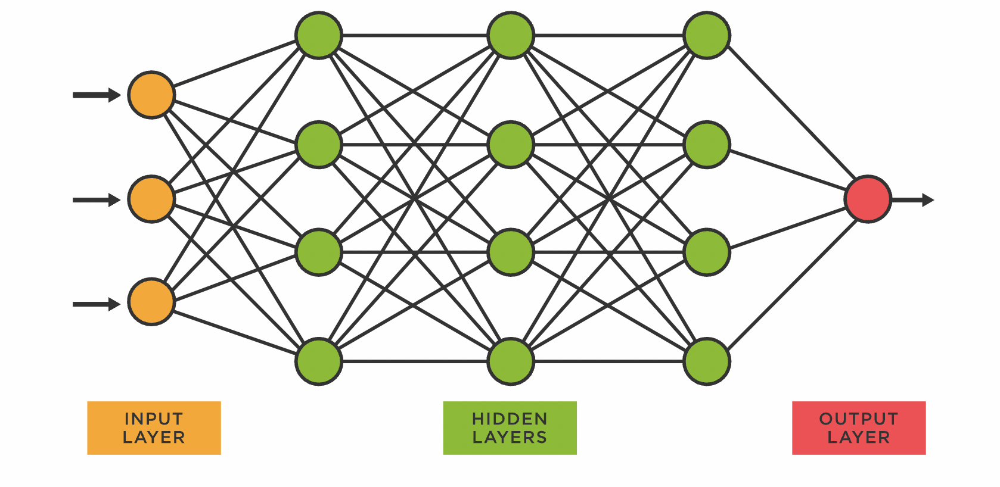

**1. Architecture**

A CNN is a type of deep learning arquitecture which aims to emulate the human vision. This architecture uses convolutions (kernels) and pooling until generate useful feature to train a classifier model.

At the beggining in this architecture, it is applied different convolutional layers, then it is flattened the representation, and then used those values as a feed-forward architecture.

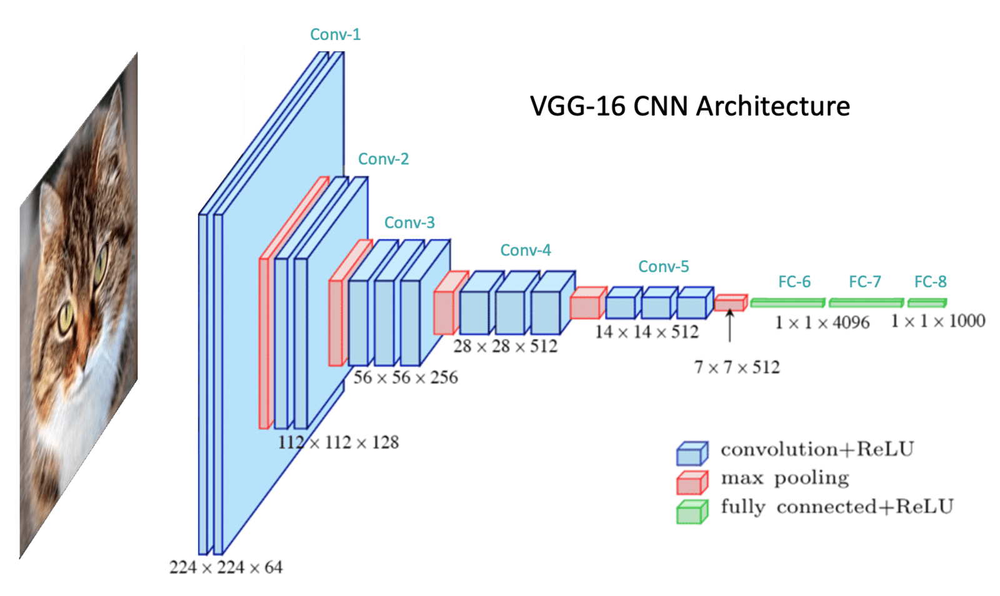

**2. Kernels**

A kernel is a different math operations set to obtain different features from images. One type of kernel can be used to get vertical lines, while a second one can be used to get horizontal lines. The final goal is to reduce the information to have available.

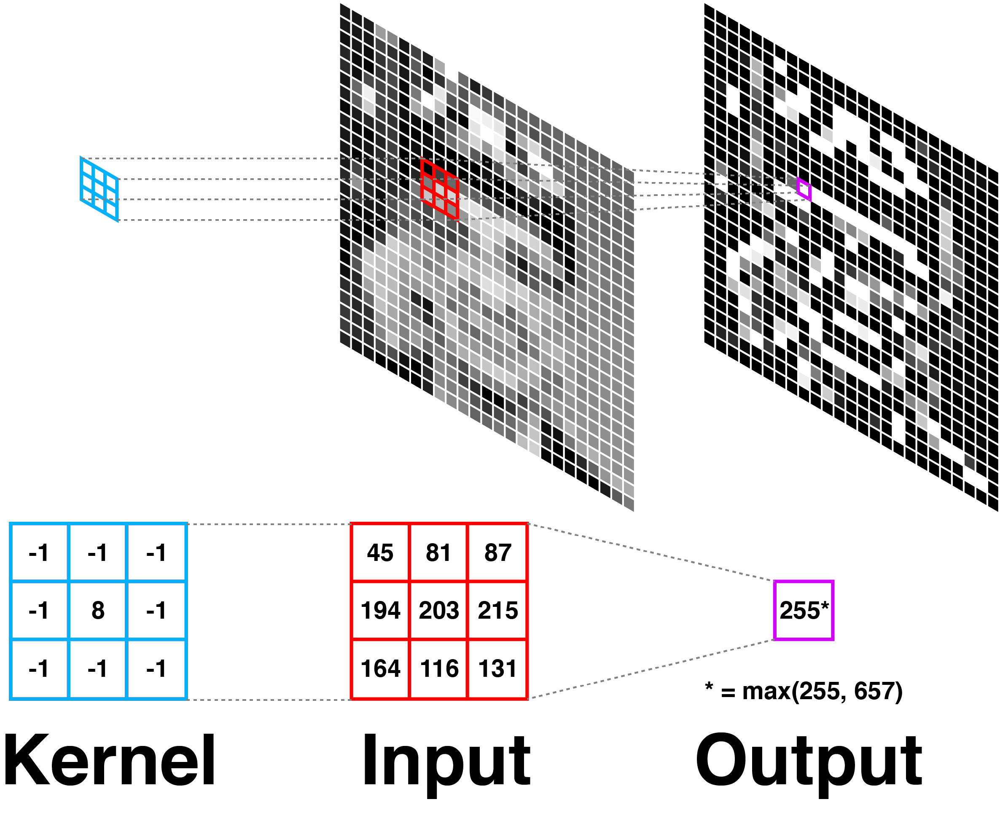

**3. Information flow**

At the begining the information is raw, but as information flows in the architecture, the representation becomes more complex and useful for the prediction.

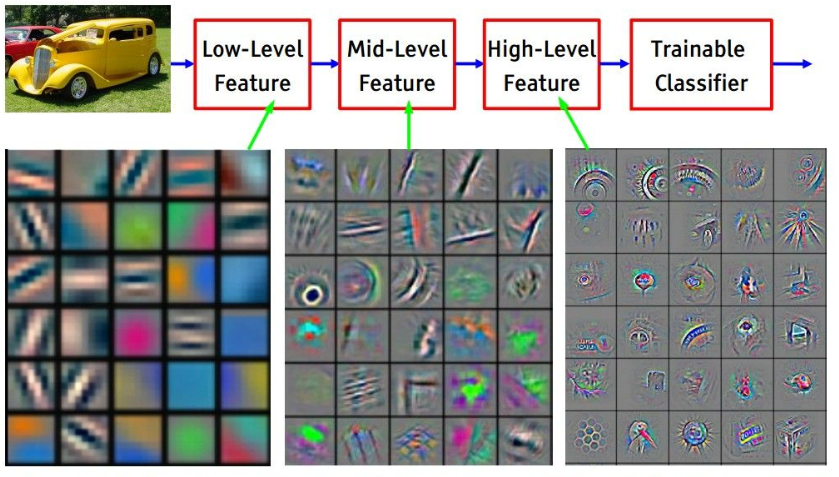

**How can I create a Pytorch model?**

- Dataset: how to load the information (path, transformations)
- Dataloader: how to give the information to the model (batch generator)
- Model: how the neural network is trained


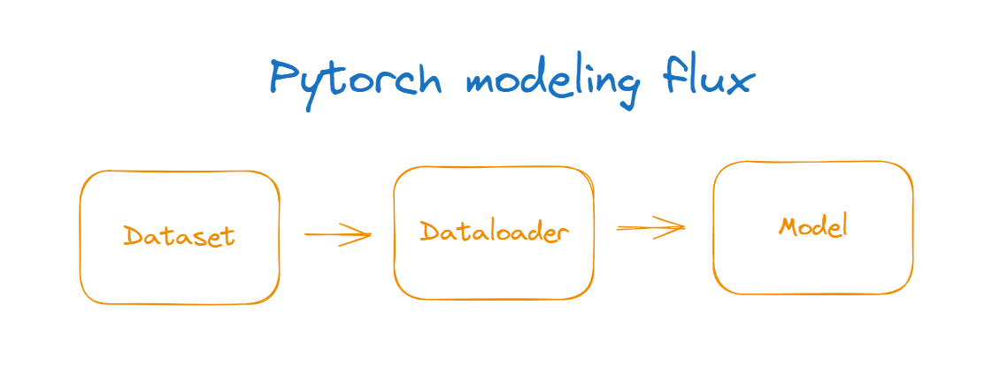

#### **Dataset creation**

Import some useful classes

In [8]:
# @title
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor

###### **Pytorch dataset**

Create my own class for a dataset

In [9]:
# @title
class LeukemiaDataSet(Dataset):
  # class constructor
  def __init__(self, root_folder, transform):
        self.data = datasets.ImageFolder(root=root_folder, transform=transform)

  # method to define the length of the data
  def __len__(self):
      return len(self.data)

  # method to return the data
  def __getitem__(self, idx):
      image, label = self.data[idx]
      return image, label

  # method to return the classes and labels
  def get_class_to_idx(self):
        return self.data.class_to_idx

  # method to return the classes
  def get_classes(self):
      return self.data.classes

Load the data

In [10]:
data = LeukemiaDataSet(root_folder="/content/Original", transform=ToTensor())

How can I see the equivalents for each class?

In [11]:
data.get_class_to_idx()

{'Benign': 0, 'Early': 1, 'Pre': 2, 'Pro': 3}

**Train-test split**

It is selected a subset of the data for training, and other totally different for testing to see how good is the model

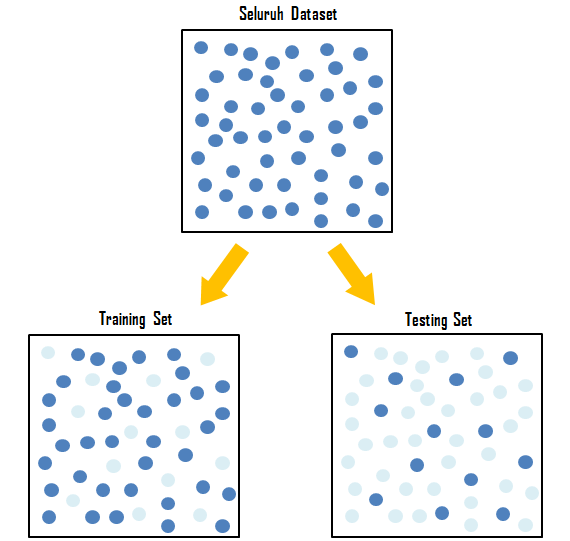

Make an split for train and test

In [12]:
from torch.utils.data import random_split

In [13]:
train_size = int(0.8 * len(data))
test_size = len(data) - train_size
train_dataset, test_dataset = random_split(data, [train_size, test_size])

##### **Pytorch data loader**

Create the data loaders

In [14]:
from torch.utils.data import DataLoader

In [15]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)

#### **Model creation**

###### **Pytorch model**

Create my own model

In [16]:
from torch import randn
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import torch

**Interaction:**

How to speed up the training of neural networks?

In [17]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Load the class to push into the huggingface hub

In [18]:
from huggingface_hub import PyTorchModelHubMixin

In [19]:
# @title
class CNNLeukemiaClassifier(nn.Module, PyTorchModelHubMixin):
  """
  Convolutional Neural Network for Leukemia Classification.

  This model uses a series of convolutional layers followed by fully connected layers
  to classify images into one of four classes. The model supports training, validation,
  and evaluation, and can upload the best performing model to Hugging Face Hub.
  """

  def __init__(self, push_hf=False):
    super(CNNLeukemiaClassifier, self).__init__()
    self.push_hf = push_hf
    self.sequence = nn.Sequential(
        nn.Conv2d(3, 128, kernel_size=(3, 3), stride=1, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2, 2)),
        nn.Dropout(0.3),

        nn.Conv2d(128, 64, kernel_size=(3, 3), stride=1, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2, 2)),
        nn.Dropout(0.3),

        nn.Conv2d(64, 32, kernel_size=(3, 3), stride=1, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2, 2)),
        nn.Dropout(0.3),

        nn.Conv2d(32, 8, kernel_size=(3, 3), stride=1, padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2, 2)),
        nn.Dropout(0.3),

        nn.Flatten(),

        nn.Linear(1568, 512),
        nn.ReLU(),
        nn.Dropout(0.5),

        nn.Linear(512, 4)
    )

    self.train_losses = []
    self.val_losses = []
    self.train_accuracies = []
    self.val_accuracies = []
    self.best_val_loss = float('inf')
    self.best_model_path = 'best_model_cnn.pth'

  def forward(self, inputs):
    """
    Forward pass through the network.

    Args:
        inputs (torch.Tensor): Input tensor.

    Returns:
        torch.Tensor: Output tensor.
    """
    return self.sequence(inputs)

  def train_model(self, train_loader, val_loader, n_epochs=10, learning_rate=1e-3):
    """
    Train the model.

    Args:
        train_loader (DataLoader): Training data loader.
        val_loader (DataLoader): Validation data loader.
        n_epochs (int): Number of epochs to train.
        learning_rate (float): Learning rate for the optimizer.

    Returns:
        CNNLeukemiaClassifier: The best model.
    """
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(self.parameters(), lr=learning_rate)

    for epoch in range(n_epochs):
      self.train()
      running_loss = 0.0
      correct_train = 0
      total = 0

      # Training loop
      for inputs, labels in tqdm(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = self(inputs)
        _, predicted = torch.max(outputs, 1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        correct_train += (predicted == labels).sum().item()
        total += labels.size(0)

      train_loss = running_loss / len(train_loader)
      train_accuracy = correct_train / total

      self.eval()
      val_loss = 0.0
      correct_test = 0
      total = 0

      # Validation loop
      with torch.no_grad():
        for inputs, labels in val_loader:
          inputs, labels = inputs.to(device), labels.to(device)
          outputs = self(inputs)
          loss = criterion(outputs, labels)
          val_loss += loss.item()
          _, predicted = torch.max(outputs, 1)
          total += labels.size(0)
          correct_test += (predicted == labels).sum().item()

      val_loss = val_loss / len(val_loader)
      val_accuracy = correct_test / total

      self.train_losses.append(train_loss)
      self.val_losses.append(val_loss)
      self.val_accuracies.append(val_accuracy)
      self.train_accuracies.append(train_accuracy)

      print(f'Epoch [{epoch+1}/{n_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, '
            f'Train Accuracy: {train_accuracy:.4f}, Val Accuracy: {val_accuracy:.4f}')

      # Save the best model based on validation loss
      if val_loss < self.best_val_loss:
        self.best_val_loss = val_loss
        self.save_best_model()

    if self.push_hf:
      self.upload_best_to_hf()
      return self.from_pretrained("sebastiansarasti/CnnLeukemiaClassification")
    else:
      return self

  def save_best_model(self):
    """
    Save the best model.
    """
    torch.save(self.state_dict(), self.best_model_path)

  def upload_best_to_hf(self):
    """
    Upload the best model to Hugging Face Hub.
    """
    self.load_state_dict(torch.load(self.best_model_path))
    self.push_to_hub("CNNLeukemiaClassification")

  def predict(self, inputs):
    """
    Make predictions with the model.

    Args:
        inputs (torch.Tensor): Input tensor.

    Returns:
        torch.Tensor: Predicted labels.
    """
    self.eval()
    with torch.no_grad():
      outputs = self(inputs.to(device))
      _, predicted = torch.max(outputs, 1)
    return predicted

  def get_metrics(self):
    """
    Get training and validation metrics.

    Returns:
        dict: Dictionary of training and validation metrics.
    """
    return {
        "train_loss": self.train_losses,
        "val_loss": self.val_losses,
        "train_accuracy": self.train_accuracies,
        "val_accuracy": self.val_accuracies
    }

Create the model

In [20]:
# uncomment this line to train the model
model2 = CNNLeukemiaClassifier().to(device) # main issue when creating models

Train the model

In [21]:
# uncomment this line to train the model
best_model2 = model2.train_model(train_loader=train_loader, val_loader=test_loader, n_epochs=3)

100%|██████████| 82/82 [00:24<00:00,  3.36it/s]


Epoch [1/3], Train Loss: 1.1631, Val Loss: 0.7639, Train Accuracy: 0.4416, Val Accuracy: 0.7454


100%|██████████| 82/82 [00:14<00:00,  5.75it/s]


Epoch [2/3], Train Loss: 0.5734, Val Loss: 0.5505, Train Accuracy: 0.7596, Val Accuracy: 0.7577


100%|██████████| 82/82 [00:12<00:00,  6.42it/s]


Epoch [3/3], Train Loss: 0.4784, Val Loss: 0.7231, Train Accuracy: 0.7930, Val Accuracy: 0.7071


#### **Model performance**

How can I see the model's performance?

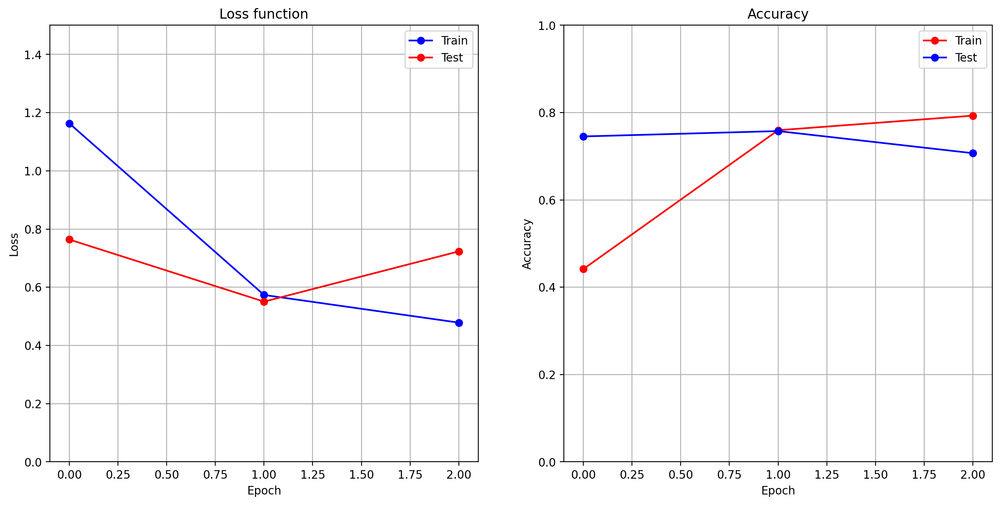

In [41]:
# @title
metrics = model2.get_metrics()
plt.figure(figsize=(15, 7), dpi=200)

plt.subplot(1, 2, 1)
plt.plot(metrics["train_loss"], "ob-", label="Train")
plt.plot(metrics["val_loss"], "or-", label="Test")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss function")
plt.ylim(0, 1.5)
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(metrics["train_accuracy"], "or-", label="Train")
plt.plot(metrics["val_accuracy"], "ob-", label="Test")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Accuracy")
plt.ylim(0, 1)
plt.grid()
plt.legend()

### **Vision Transformers (ViT)**

**1. Inspiration**

**Interaction**

What is the difference between a muffin and a chihuahua?

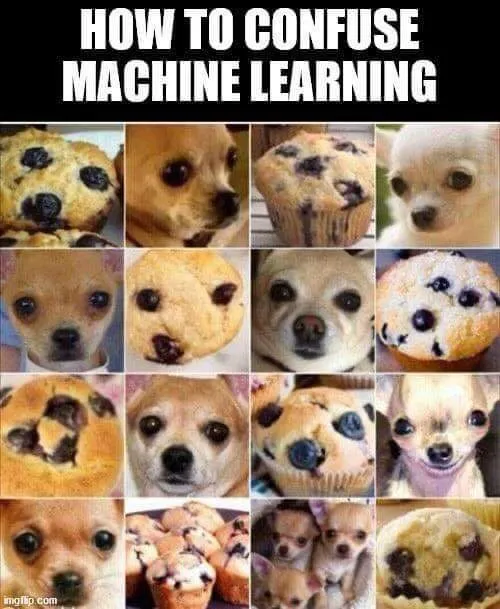

What is a transformer architecture?

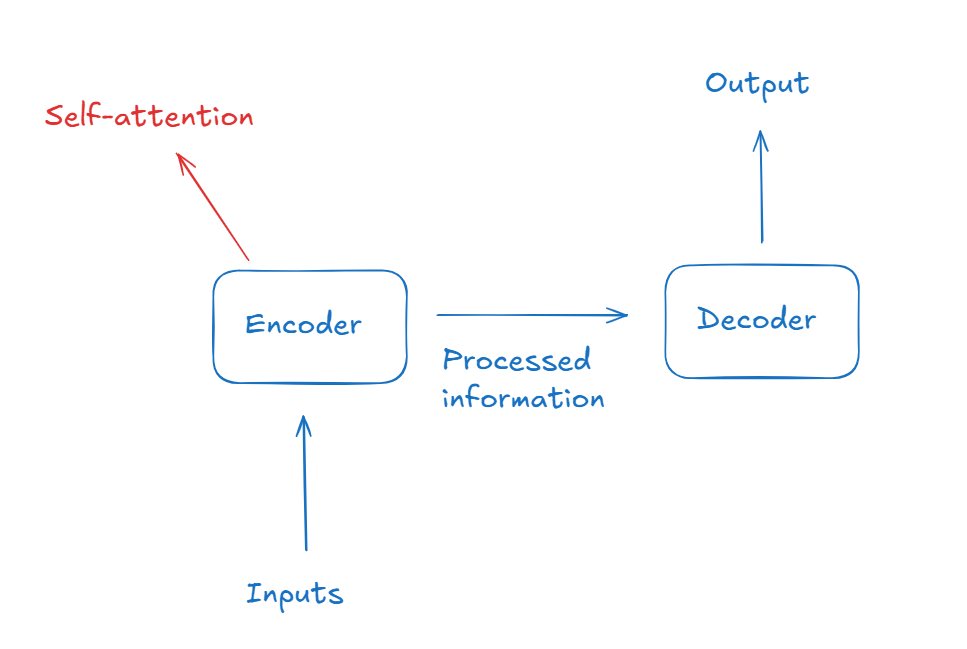

Self-attention mechanism

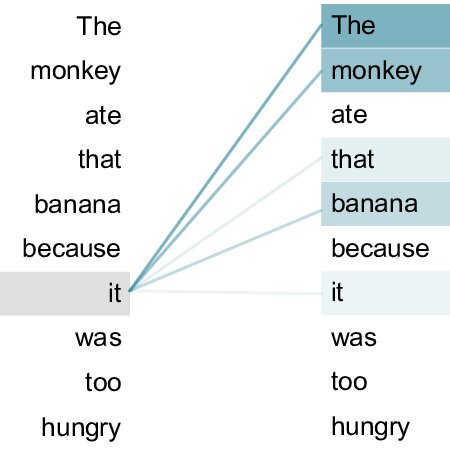

This is the typical meme and test to measure how good is your model for computer vision. The ViT solves this problem because they use the self-attention mechanism. This helps to establish relationships between each part of the picture.

**2. Architecture**

Vision-Transformers (ViT) comes from the traditional transformers used for natural language applications (e.g.: ChatGPT). In this case, for vision, they only use the encoder head, ViT does not uses the decoder head.

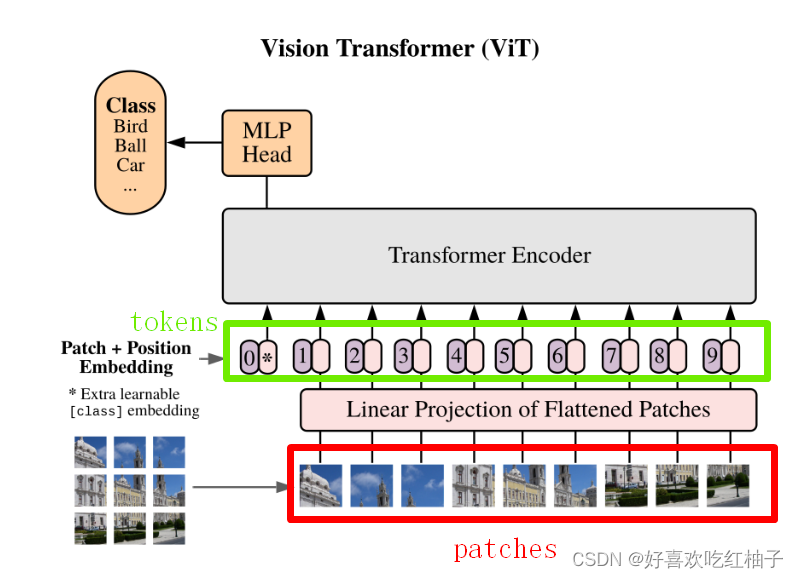

**3. Transfer learning**

**Interation:**
What is transfer learning?

Deep learning methods can be used trained in a tasks A, and then applied to solved a similar task B.

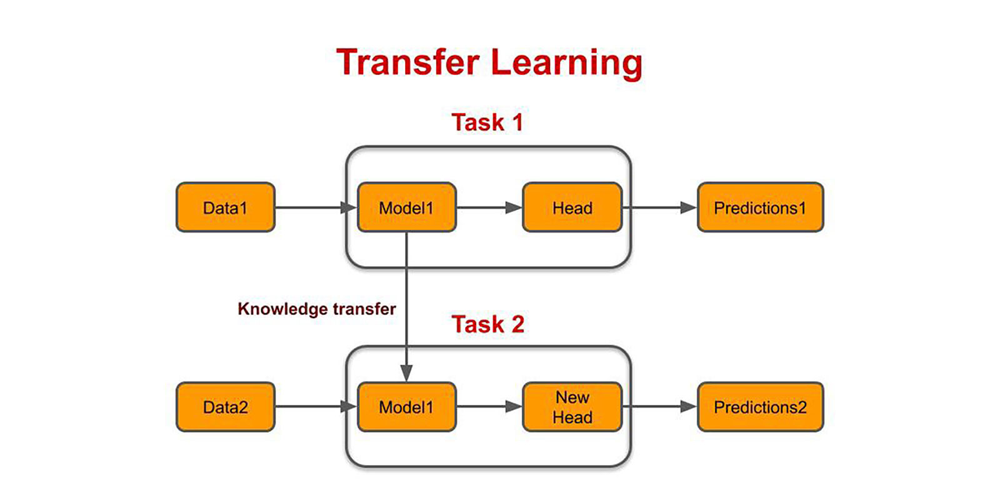

Original model: https://huggingface.co/microsoft/swin-base-patch4-window7-224

Trained with COCO with 1000 classes as labels.

**Fundamentals of Pytorch**

- Dataset: how to load the information (path, transformations)
- Dataloader: how to give the information to the model (batch generator)
- Model: how the neural network is trained


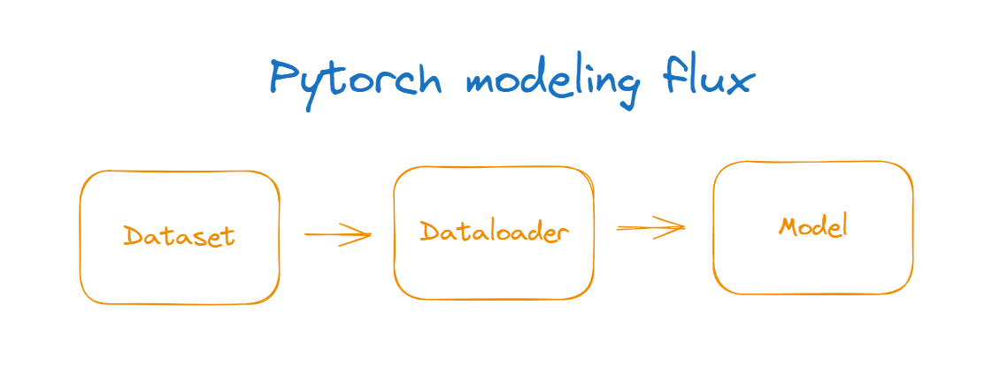

#### **Dataset creation**

##### **Pytorch dataset**

Create my own class for a dataset with a modification for the transformer

In [23]:
from transformers import AutoImageProcessor

In [24]:
# @title
processor = AutoImageProcessor.from_pretrained("microsoft/swin-base-patch4-window7-224")

preprocessor_config.json:   0%|          | 0.00/255 [00:00<?, ?B/s]

In [25]:
# @title
class LeukemiaDataSetViT(Dataset):
  # class constructor
  def __init__(self, root_folder, transform=None):
        self.data = datasets.ImageFolder(root=root_folder, transform=transform)

  # method to define the length of the data
  def __len__(self):
      return len(self.data)

  # method to return the data
  def __getitem__(self, idx):
      image, label = self.data[idx]
      image = processor(image, return_tensors="pt")['pixel_values'].squeeze()
      return image, label

  # method to return the classes and labels
  def get_class_to_idx(self):
        return self.data.class_to_idx

  # method to return the classes
  def get_classes(self):
      return self.data.classes

In [26]:
data_vit = LeukemiaDataSetViT(root_folder="/content/Original")

See the class equivalents

In [27]:
data_vit.get_class_to_idx()

{'Benign': 0, 'Early': 1, 'Pre': 2, 'Pro': 3}

**Train-test split**

It is selected a subset of the data for training, and other totally different for testing to see how good is the model

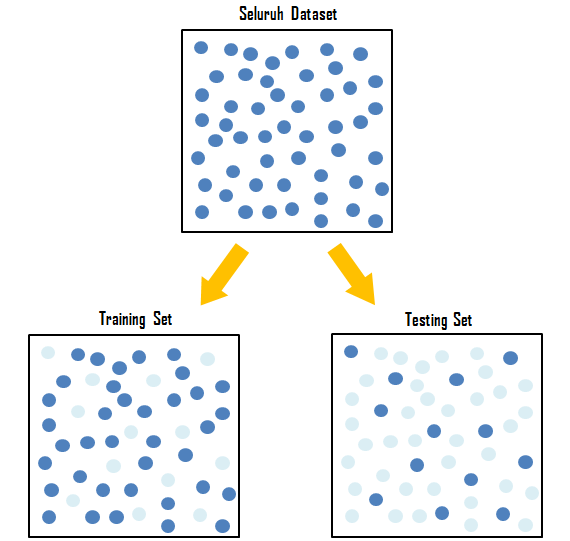

Make an split for train and test

In [28]:
from torch.utils.data import random_split

In [29]:
train_size = int(0.8 * len(data_vit))
test_size = len(data_vit) - train_size
train_dataset, test_dataset = random_split(data_vit, [train_size, test_size])

###### **Pytorch data loader**

Create the data loaders

In [30]:
from torch.utils.data import DataLoader

In [31]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)

#### **Model creation**

##### **Pytorch model**

Download a ViT

In [32]:
from transformers import AutoModelForImageClassification

In [33]:
# @title
class ViTLeukemiaClassifier(nn.Module, PyTorchModelHubMixin):
  """
  Vision Transformer (ViT) based model for Leukemia Classification.

  This model uses a pre-trained Vision Transformer as the base model and adds
  fully connected layers for classification. It supports training, validation,
  and evaluation, and can upload the best performing model to Hugging Face Hub.
  """
  def __init__(self, push_hub=False):
    super(ViTLeukemiaClassifier, self).__init__()
    model = AutoModelForImageClassification.from_pretrained("microsoft/swin-base-patch4-window7-224")
    self.base_model = model.swin
    self.flatten = nn.Flatten()
    self.sequence = nn.Sequential(
        nn.Linear(49 * 1024, 100),
        nn.ReLU(),
        nn.Linear(100, 4)
    )
    for param in self.base_model.parameters():
        param.requires_grad = False

    self.train_losses = []
    self.val_losses = []
    self.train_accuracies = []
    self.val_accuracies = []
    self.best_val_loss = float('inf')
    self.best_model_path = 'best_model_vit.pth'
    self.push_hub = push_hub

  def forward(self, inputs):
    """
    Forward pass through the network.

    Args:
        inputs (torch.Tensor): Input tensor.

    Returns:
        torch.Tensor: Output tensor.
    """
    x = self.base_model(inputs)
    x = x['last_hidden_state']
    x = self.flatten(x)
    x = self.sequence(x)
    return x


  def train_model(self, train_loader, val_loader, n_epochs=10, learning_rate=1e-3):
    """
    Train the model.

    Args:
        train_loader (DataLoader): Training data loader.
        val_loader (DataLoader): Validation data loader.
        n_epochs (int): Number of epochs to train.
        learning_rate (float): Learning rate for the optimizer.

    Returns:
        ViTLeukemiaClassifier: The best model.
    """
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(self.parameters(), lr=learning_rate)

    for epoch in range(n_epochs):
      self.train()
      running_loss = 0.0
      correct_train = 0
      total = 0

      # Training loop
      for inputs, labels in tqdm(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = self(inputs)
        _, predicted = torch.max(outputs, 1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        correct_train += (predicted == labels).sum().item()
        total += labels.size(0)

      train_loss = running_loss / len(train_loader)
      train_accuracy = correct_train / total

      self.eval()
      val_loss = 0.0
      correct_test = 0
      total = 0

      # Validation loop
      with torch.no_grad():
        for inputs, labels in val_loader:
          inputs, labels = inputs.to(device), labels.to(device)
          outputs = self(inputs)
          loss = criterion(outputs, labels)
          val_loss += loss.item()
          _, predicted = torch.max(outputs, 1)
          total += labels.size(0)
          correct_test += (predicted == labels).sum().item()

      val_loss = val_loss / len(val_loader)
      val_accuracy = correct_test / total

      self.train_losses.append(train_loss)
      self.val_losses.append(val_loss)
      self.val_accuracies.append(val_accuracy)
      self.train_accuracies.append(train_accuracy)

      print(f'Epoch [{epoch+1}/{n_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, '
            f'Train Accuracy: {train_accuracy:.4f}, Val Accuracy: {val_accuracy:.4f}')

      # Save the best model based on validation loss
      if val_loss < self.best_val_loss:
        self.best_val_loss = val_loss
        self.save_best_model()

    if self.push_hub:
      self.upload_best_to_hf()
      return self.from_pretrained("sebastiansarasti/ViTLeukemiaClassification")
    else:
      return self

  def save_best_model(self):
    """
    Save the best model.
    """
    torch.save(self.state_dict(), self.best_model_path)

  def upload_best_to_hf(self):
    """
    Upload the best model to Hugging Face Hub.
    """
    self.load_state_dict(torch.load(self.best_model_path))
    self.push_to_hub("ViTLeukemiaClassification")

  def predict(self, inputs):
    """
    Make predictions with the model.

    Args:
        inputs (torch.Tensor): Input tensor.

    Returns:
        torch.Tensor: Predicted labels.
    """
    self.eval()
    with torch.no_grad():
      outputs = self(inputs.to(device))
      _, predicted = torch.max(outputs, 1)
    return predicted

  def get_metrics(self):
    """
    Get training and validation metrics.

    Returns:
        dict: Dictionary of training and validation metrics.
    """
    return {
        "train_loss": self.train_losses,
        "val_loss": self.val_losses,
        "train_accuracy": self.train_accuracies,
        "val_accuracy": self.val_accuracies
    }

In [34]:
# uncomment this line to train
model3 = ViTLeukemiaClassifier().to(device)

config.json:   0%|          | 0.00/71.8k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/352M [00:00<?, ?B/s]

In [35]:
# uncomment this line for training
best_model3 = model3.train_model(train_loader=train_loader, val_loader=test_loader, n_epochs=3)

100%|██████████| 82/82 [00:36<00:00,  2.27it/s]


Epoch [1/3], Train Loss: 0.7194, Val Loss: 0.0814, Train Accuracy: 0.8763, Val Accuracy: 0.9709


100%|██████████| 82/82 [00:36<00:00,  2.26it/s]


Epoch [2/3], Train Loss: 0.0752, Val Loss: 0.0293, Train Accuracy: 0.9762, Val Accuracy: 0.9862


100%|██████████| 82/82 [00:37<00:00,  2.21it/s]


Epoch [3/3], Train Loss: 0.0395, Val Loss: 0.0210, Train Accuracy: 0.9862, Val Accuracy: 0.9908


#### **Model performance**

How to measure the performance of the models.

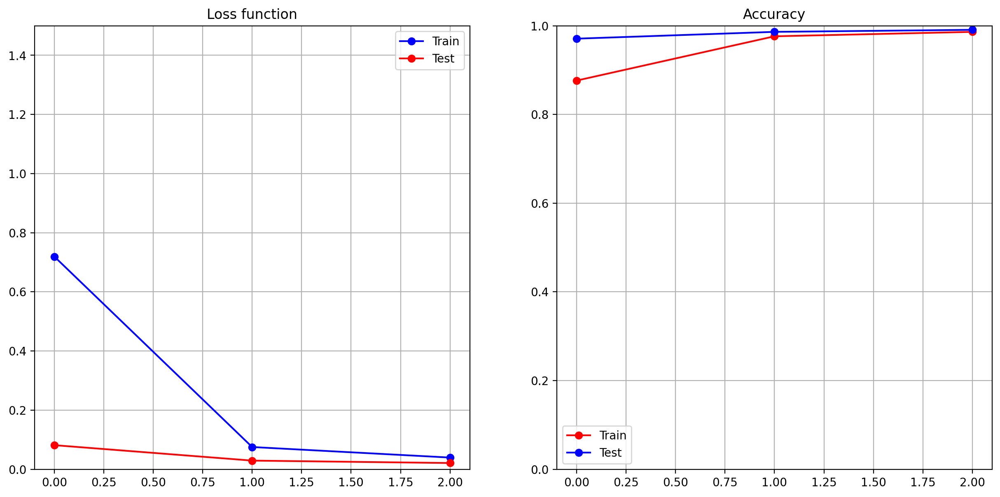

In [40]:
# @title
metrics = model3.get_metrics()
plt.figure(figsize=(15, 7), dpi=200)

plt.subplot(1, 2, 1)
plt.plot(metrics["train_loss"], "ob-", label="Train")
plt.plot(metrics["val_loss"], "or-", label="Test")
plt.title("Loss function")
plt.ylim(0, 1.5)
plt.grid()
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(metrics["train_accuracy"], "or-", label="Train")
plt.plot(metrics["val_accuracy"], "ob-", label="Test")
plt.title("Accuracy")
plt.ylim(0, 1)
plt.grid()
plt.legend()

## **Predictions**

Now, we are going to select a picture, and see how the models behave

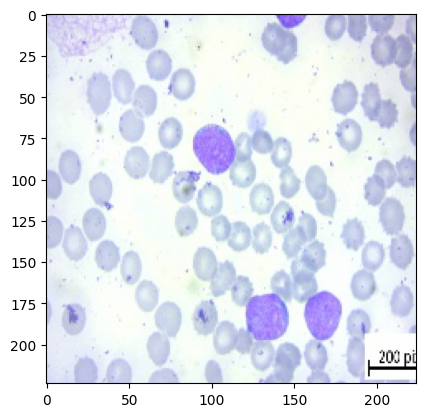

In [ ]:
plt.imshow(data[800][0].permute(1, 2, 0))

See the label

In [ ]:
data[800][1]

1

Select the image

In [ ]:
img1 = data[800]
img2 = data_vit[800]

Load the models from huggingface

In [ ]:
model1 = CNNLeukemiaClassifier.from_pretrained("sebastiansarasti/CnnLeukemiaClassification").to(device)

model.safetensors:   0%|          | 0.00/3.62M [00:00<?, ?B/s]

In [ ]:
model2 = ViTLeukemiaClassifier.from_pretrained("sebastiansarasti/ViTLeukemiaClassification").to(device)

config.json:   0%|          | 0.00/22.0 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/368M [00:00<?, ?B/s]

In [ ]:
model1.predict(img1[0].to(device).unsqueeze(0))

tensor([1], device='cuda:0')

In [ ]:
model2.predict(img2[0].to(device).unsqueeze(0))

tensor([1], device='cuda:0')

## **Conclusions**

- The ViT architecture is able to overcome the performance of the CNN.
- The CNN is not able to perform as well as the ViT because the size of the data used for the training in the ViT.
- The ViT is feasible when we are limited in computer resources.

## **Model repositories**:

- Convolutional Neural Network: https://huggingface.co/sebastiansarasti/CnnLeukemiaClassification
- Vision Transformer: https://huggingface.co/sebastiansarasti/ViTLeukemiaClassification
- GitHub: https://github.com/sebassaras02/quito-ai-day

## **Questions**



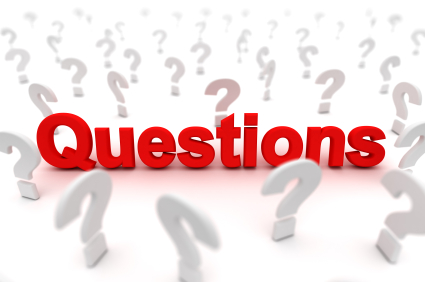